# Libraries & Imports

In [31]:
# Libraries & Imports

!pip install mlxtend
!pip install prophet
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from prophet import Prophet
from mlxtend.plotting import plot_decision_regions
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

In [32]:
# Dataset imports

happiness = pd.read_csv("Resources/WHR 2005 to 2023.csv")
happiness.head()

,Country Name,Regional Indicator,Year,Life Ladder,Log GDP Per Capita,Social Support,Healthy Life Expectancy At Birth,Freedom To Make Life Choices,Generosity,Perceptions Of Corruption,Positive Affect,Negative Affect,Confidence In National Government
0,Afghanistan,South Asia,2008,3.723590,7.350416,0.450662,50.500000,0.718114,0.167652,0.881686,0.414297,0.258195,0.612072
1,Afghanistan,South Asia,2009,4.401778,7.508646,0.552308,50.799999,0.678896,0.190809,0.850035,0.481421,0.237092,0.611545
2,Afghanistan,South Asia,2010,4.758381,7.613900,0.539075,51.099998,0.600127,0.121316,0.706766,0.516907,0.275324,0.299357
3,Afghanistan,South Asia,2011,3.831719,7.581259,0.521104,51.400002,0.495901,0.163571,0.731109,0.479835,0.267175,0.307386
4,Afghanistan,South Asia,2012,3.782938,7.660506,0.520637,51.700001,0.530935,0.237588,0.775620,0.613513,0.267919,0.435440


# Training & Testing Data

In [33]:
# Split the dataset into training and testing data
train_data = happiness[happiness['Year'] <= 2014]
test_data = happiness[happiness['Year'] >= 2015]

In [34]:
# Define X and y for training
X_train = train_data['Year']
y_train = train_data['Life Ladder']

# Linear Regression

In [35]:
# Define X_train and y_train
X_train = train_data[['Year']]  # Features (assuming 'Year' is the only feature for now)
y_train = train_data['Life Ladder']  # Target variable

# Initialize the model (e.g., Linear Regression)
model = LinearRegression()

# Fit the model to the training data
model.fit(X_train, y_train)

LinearRegression()

In [36]:
# Define X_test and y_test
X_test = test_data[['Year']]
y_test = test_data['Life Ladder']

# Make predictions on the test data
y_pred = model.predict(X_test)

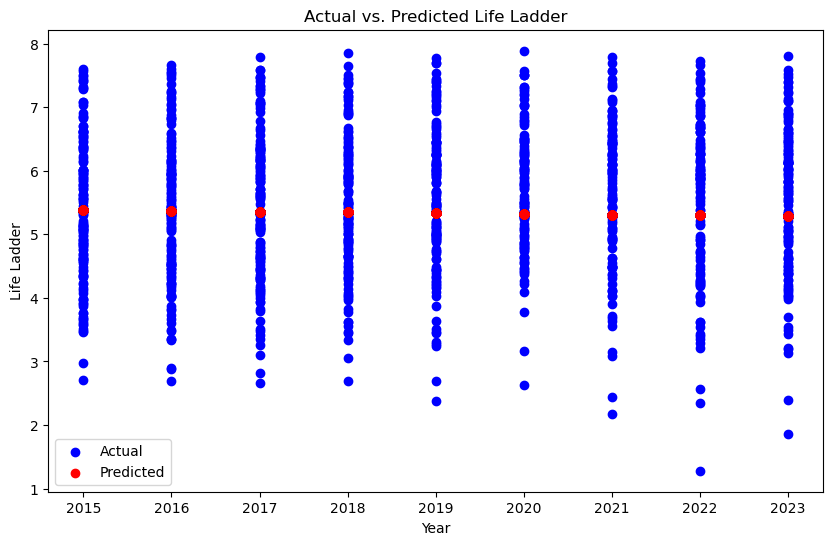

In [37]:
# Plot the Actual vs. Predicted Life Ladder

plt.figure(figsize=(10, 6))
plt.scatter(X_test, y_test, color='blue', label='Actual')
plt.scatter(X_test, y_pred, color='red', label='Predicted')
plt.title('Actual vs. Predicted Life Ladder')
plt.xlabel('Year')
plt.ylabel('Life Ladder')
plt.legend()
plt.show()

In [38]:
# Calculate evaluation metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

C:\Users\Sean\AppData\Local\Temp\ipykernel_21452\67195158.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'k--', lw=2, color='red', label='Ideal')


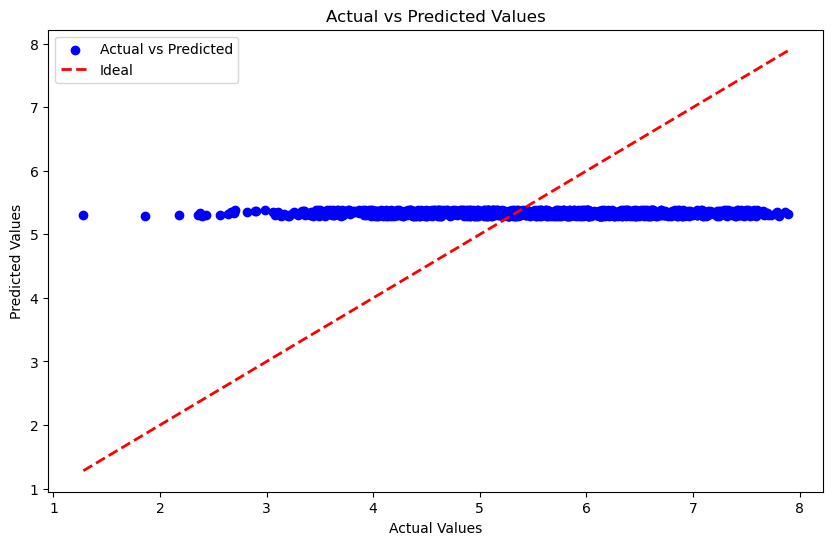

In [39]:
# Plot predicted vs actual values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='blue', label='Actual vs Predicted')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'k--', lw=2, color='red', label='Ideal')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.legend()
plt.show()

In [40]:
# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Print Mean Squared Error and R^2 Score
print("Mean Squared Error:", mse)
print("R^2 Score:", r2)

Mean Squared Error: 1.3159033091079715
R^2 Score: -0.0334097602482224


In [41]:
# Filter data for training (2005-2014) and testing (2015-2023)
train_data = happiness[happiness['Year'] <= 2014]
test_data = happiness[happiness['Year'] >= 2015]

# Define features (X) and target variable (y) for training
X_train = train_data.drop(columns=['Year', 'Life Ladder'])
y_train = train_data['Life Ladder']

# Define features (X) and target variable (y) for testing
X_test = test_data.drop(columns=['Year', 'Life Ladder'])
y_test = test_data['Life Ladder']

In [42]:
# Convert 'Year' column to numeric data type
train_data['Year'] = pd.to_numeric(train_data['Year'])

# Define X and y for training
X_train = train_data[['Year']]  # Ensure X_train is a DataFrame
y_train = train_data['Life Ladder']

# Initialize the Linear Regression model
model = LinearRegression()

# Fit the model to the training data
model.fit(X_train, y_train)

C:\Users\Sean\AppData\Local\Temp\ipykernel_21452\920934713.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_data['Year'] = pd.to_numeric(train_data['Year'])


LinearRegression()

In [43]:
# Predict on the test data
X_test = test_data[['Year']]  # Ensure X_test is a DataFrame
y_test_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(test_data['Life Ladder'], y_test_pred)
r2 = r2_score(test_data['Life Ladder'], y_test_pred)

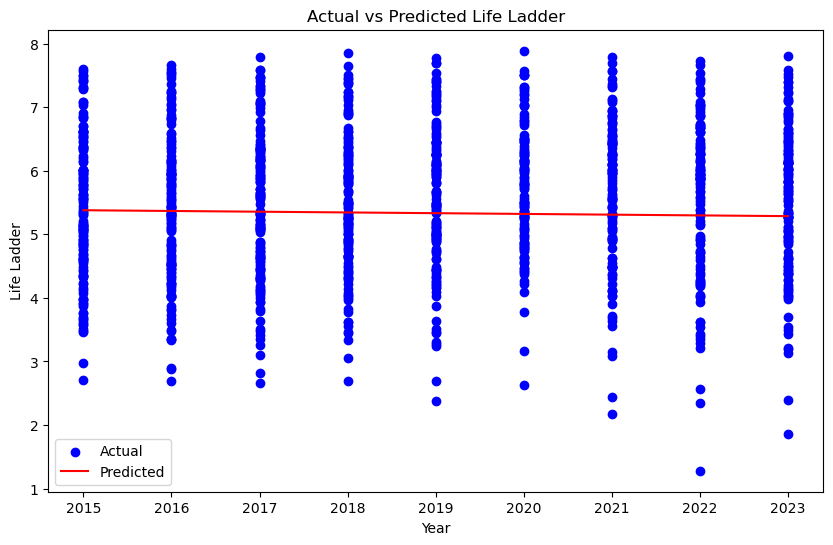

In [44]:
# Visualize the predicted vs actual values
plt.figure(figsize=(10, 6))
plt.scatter(test_data['Year'], test_data['Life Ladder'], color='blue', label='Actual')
plt.plot(test_data['Year'], y_test_pred, color='red', label='Predicted')
plt.title('Actual vs Predicted Life Ladder')
plt.xlabel('Year')
plt.ylabel('Life Ladder')
plt.legend()
plt.show()

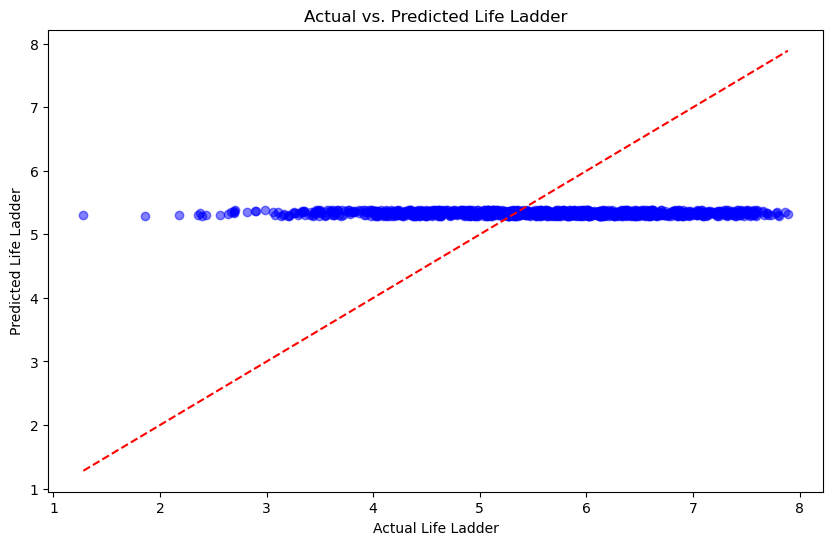

In [45]:
# Create a scatter plot of actual vs. predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_test_pred, color='blue', alpha=0.5)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')
plt.xlabel('Actual Life Ladder')
plt.ylabel('Predicted Life Ladder')
plt.title('Actual vs. Predicted Life Ladder')
plt.show()

In [46]:
# Make predictions on the test set
X_test = test_data['Year']
y_test = test_data['Life Ladder']
X_test_reshaped = X_test.values.reshape(-1, 1)
y_pred = model.predict(X_test_reshaped)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

C:\Users\Sean\anaconda3\envs\dev\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [47]:
# Display data types
happiness.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2336 entries, 0 to 2335
Data columns (total 13 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Country Name                       2336 non-null   object 
 1   Regional Indicator                 2336 non-null   object 
 2   Year                               2336 non-null   int64  
 3   Life Ladder                        2336 non-null   float64
 4   Log GDP Per Capita                 2316 non-null   float64
 5   Social Support                     2323 non-null   float64
 6   Healthy Life Expectancy At Birth   2281 non-null   float64
 7   Freedom To Make Life Choices       2303 non-null   float64
 8   Generosity                         2263 non-null   float64
 9   Perceptions Of Corruption          2220 non-null   float64
 10  Positive Affect                    2175 non-null   float64
 11  Negative Affect                    2183 non-null   float

In [48]:
# Shape of the data
happiness.shape

(2336, 13)

In [49]:
# Check the data types
happiness.dtypes

Country Name                          object
Regional Indicator                    object
Year                                   int64
Life Ladder                          float64
Log GDP Per Capita                   float64
Social Support                       float64
Healthy Life Expectancy At Birth     float64
Freedom To Make Life Choices         float64
Generosity                           float64
Perceptions Of Corruption            float64
Positive Affect                      float64
Negative Affect                      float64
Confidence In National Government    float64
dtype: object

In [50]:
# Check for null values
happiness.isnull().sum()

Country Name                           0
Regional Indicator                     0
Year                                   0
Life Ladder                            0
Log GDP Per Capita                    20
Social Support                        13
Healthy Life Expectancy At Birth      55
Freedom To Make Life Choices          33
Generosity                            73
Perceptions Of Corruption            116
Positive Affect                      161
Negative Affect                      153
Confidence In National Government    498
dtype: int64

In [51]:
# Plot all columns
cols_to_plot = ['']

# Prophet

In [52]:
# Prophet model
prophet_model = Prophet()

In [53]:
# Prophet model
model = Prophet()

In [54]:
# Print happiness head and datatypes
print(happiness.head())
print(happiness.dtypes)

  Country Name Regional Indicator  Year  Life Ladder  Log GDP Per Capita  \
0  Afghanistan         South Asia  2008     3.723590            7.350416   
1  Afghanistan         South Asia  2009     4.401778            7.508646   
2  Afghanistan         South Asia  2010     4.758381            7.613900   
3  Afghanistan         South Asia  2011     3.831719            7.581259   
4  Afghanistan         South Asia  2012     3.782938            7.660506   

   Social Support  Healthy Life Expectancy At Birth  \
0        0.450662                         50.500000   
1        0.552308                         50.799999   
2        0.539075                         51.099998   
3        0.521104                         51.400002   
4        0.520637                         51.700001   

   Freedom To Make Life Choices  Generosity  Perceptions Of Corruption  \
0                      0.718114    0.167652                   0.881686   
1                      0.678896    0.190809                   0.

In [55]:
# Convert 'Year' column to datetime format and rename it to 'ds'
happiness['ds'] = pd.to_datetime(happiness['Year'], format='%Y')

# Select a column containing the target variable and rename it to 'y'
happiness.rename(columns={'Life Ladder': 'y'}, inplace=True)

# Check the first few rows and data types again to verify the changes
print(happiness.head())
print(happiness.dtypes)

  Country Name Regional Indicator  Year         y  Log GDP Per Capita  \
0  Afghanistan         South Asia  2008  3.723590            7.350416   
1  Afghanistan         South Asia  2009  4.401778            7.508646   
2  Afghanistan         South Asia  2010  4.758381            7.613900   
3  Afghanistan         South Asia  2011  3.831719            7.581259   
4  Afghanistan         South Asia  2012  3.782938            7.660506   

   Social Support  Healthy Life Expectancy At Birth  \
0        0.450662                         50.500000   
1        0.552308                         50.799999   
2        0.539075                         51.099998   
3        0.521104                         51.400002   
4        0.520637                         51.700001   

   Freedom To Make Life Choices  Generosity  Perceptions Of Corruption  \
0                      0.718114    0.167652                   0.881686   
1                      0.678896    0.190809                   0.850035   
2       

In [56]:
# Fit the Prophet model to the data
model.fit(happiness)

23:28:47 - cmdstanpy - INFO - Chain [1] start processing
23:28:47 - cmdstanpy - INFO - Chain [1] done processing


In [57]:
# Create a DataFrame for the next X years
future_dates = model.make_future_dataframe(periods=30, freq='Y')

In [58]:
# Make predictions for the future dates
forecast = model.predict(future_dates)

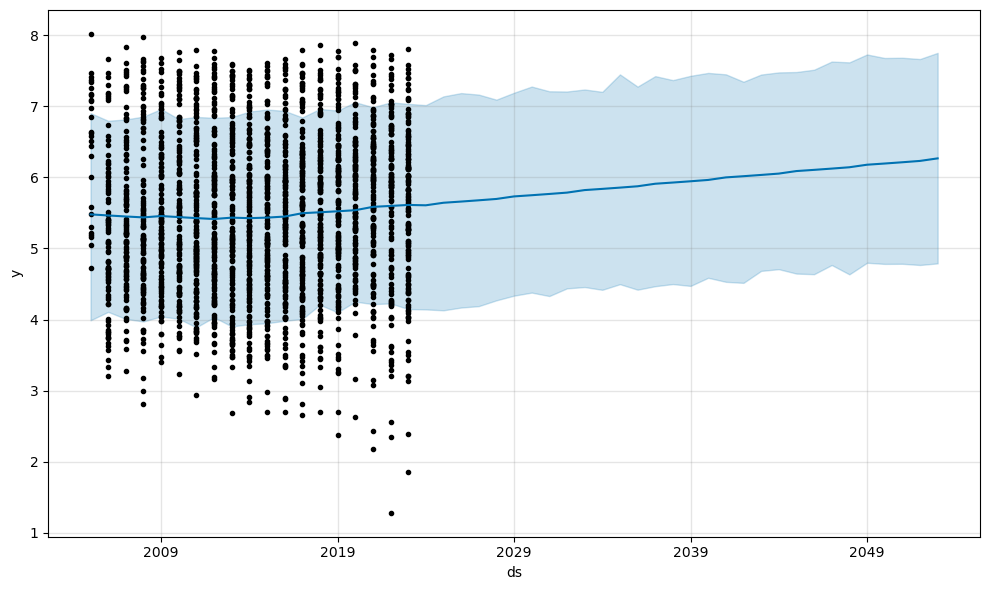

In [59]:
# Plot the forecast
fig = model.plot(forecast)

In [60]:
# Split the dataset into training and testing data
train_data = happiness[happiness['Year'] <= 2014]
test_data = happiness[happiness['Year'] >= 2015]

In [61]:
# Add SimpleImputer
imputer = SimpleImputer(strategy='mean')
imputer.fit(happiness.select_dtypes(include=np.number))

SimpleImputer()

In [62]:
# Impute missing values using the mean and create a new dataframe
happiness_imputed = pd.DataFrame(imputer.transform(happiness.select_dtypes(include=np.number)), columns=happiness.select_dtypes(include=np.number).columns)

In [63]:
# Assign categorical columns from the original dataframe to the corresponding columns in the imputed dataframe
categorical_cols = happiness.select_dtypes(exclude=np.number).columns
happiness_imputed[categorical_cols] = happiness[categorical_cols]

In [64]:
# Check for any missing values
happiness_imputed.isnull().sum()

Year                                 0
y                                    0
Log GDP Per Capita                   0
Social Support                       0
Healthy Life Expectancy At Birth     0
Freedom To Make Life Choices         0
Generosity                           0
Perceptions Of Corruption            0
Positive Affect                      0
Negative Affect                      0
Confidence In National Government    0
Country Name                         0
Regional Indicator                   0
ds                                   0
dtype: int64

In [65]:
# Label the X and y axes
X = happiness_imputed.drop(columns=['Year'])
y = happiness_imputed['y']

In [66]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [67]:
# Print datatypes
print("X_train data types:")
print(X_train.dtypes)
print("\n")
print("y_train data types:")
print(y_train.dtypes)

X_train data types:
y                                           float64
Log GDP Per Capita                          float64
Social Support                              float64
Healthy Life Expectancy At Birth            float64
Freedom To Make Life Choices                float64
Generosity                                  float64
Perceptions Of Corruption                   float64
Positive Affect                             float64
Negative Affect                             float64
Confidence In National Government           float64
Country Name                                 object
Regional Indicator                           object
ds                                   datetime64[ns]
dtype: object


y_train data types:
float64


In [68]:
# Perform one-hot encoding on categorical variables
happiness_encoded = pd.get_dummies(happiness_imputed, columns=['Country Name', 'Regional Indicator'])

In [69]:
# Define the model
model = LinearRegression()

In [70]:
# Encode categorical variables using one-hot encoding
X_encoded = pd.get_dummies(X)

In [71]:
# Split the encoded data into training and testing sets
X_train_encoded, X_test_encoded, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Random Forest & Nearest Neighbors

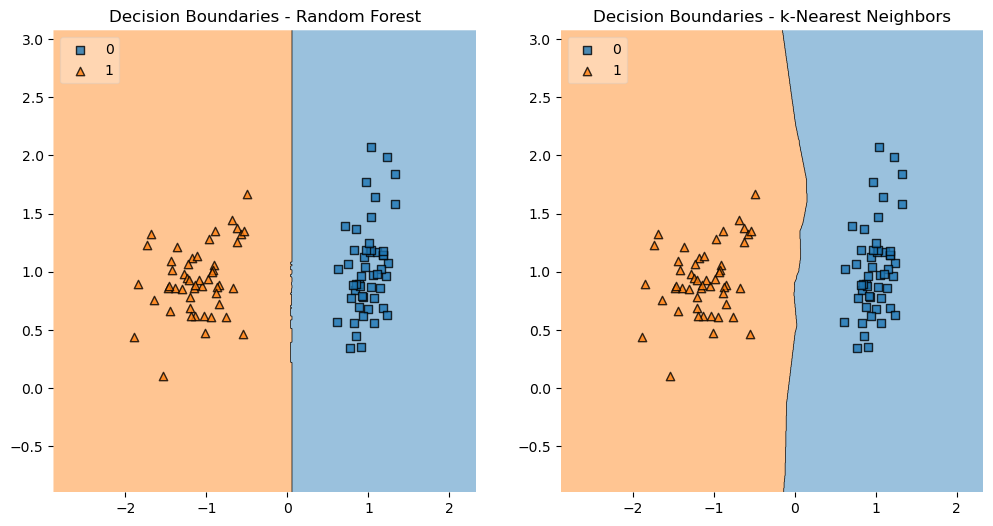

In [72]:
# Generate synthetic dataset
X, y = make_classification(n_features=2, n_redundant=0, n_informative=2,
                           random_state=1, n_clusters_per_class=1)

# Define classifiers
rf_clf = RandomForestClassifier(n_estimators=100, random_state=1)
knn_clf = KNeighborsClassifier(n_neighbors=3)

# Fit classifiers
rf_clf.fit(X, y)
knn_clf.fit(X, y)

# Plot decision boundaries
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plot_decision_regions(X, y, clf=rf_clf, legend=2)
plt.title('Decision Boundaries - Random Forest')

plt.subplot(1, 2, 2)
plot_decision_regions(X, y, clf=knn_clf, legend=2)
plt.title('Decision Boundaries - k-Nearest Neighbors')

plt.show()

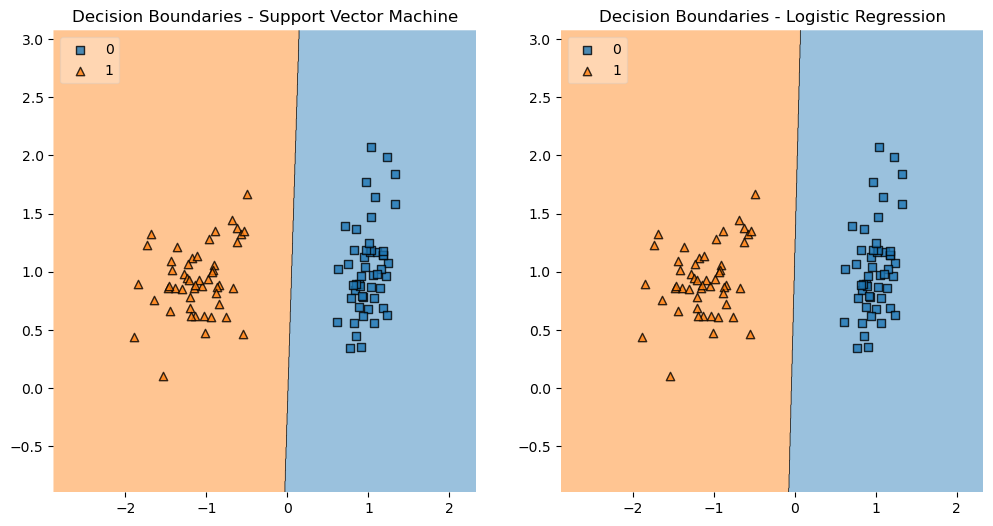

In [73]:
# Define classifiers
svm_clf = SVC(kernel='linear', C=1.0, random_state=1)
lr_clf = LogisticRegression(random_state=1)

# Fit classifiers
svm_clf.fit(X, y)
lr_clf.fit(X, y)

# Plot decision boundaries
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plot_decision_regions(X, y, clf=svm_clf, legend=2)
plt.title('Decision Boundaries - Support Vector Machine')

plt.subplot(1, 2, 2)
plot_decision_regions(X, y, clf=lr_clf, legend=2)
plt.title('Decision Boundaries - Logistic Regression')

plt.show()

# Happiness Charts

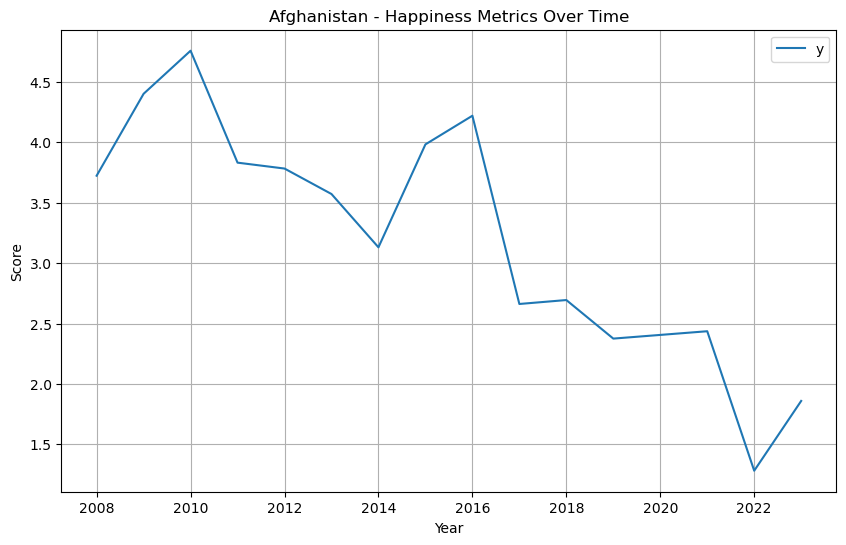

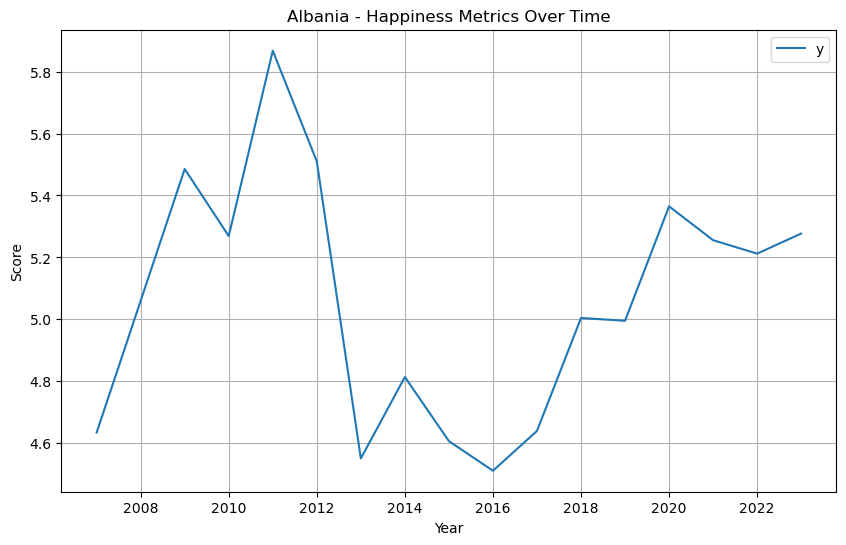

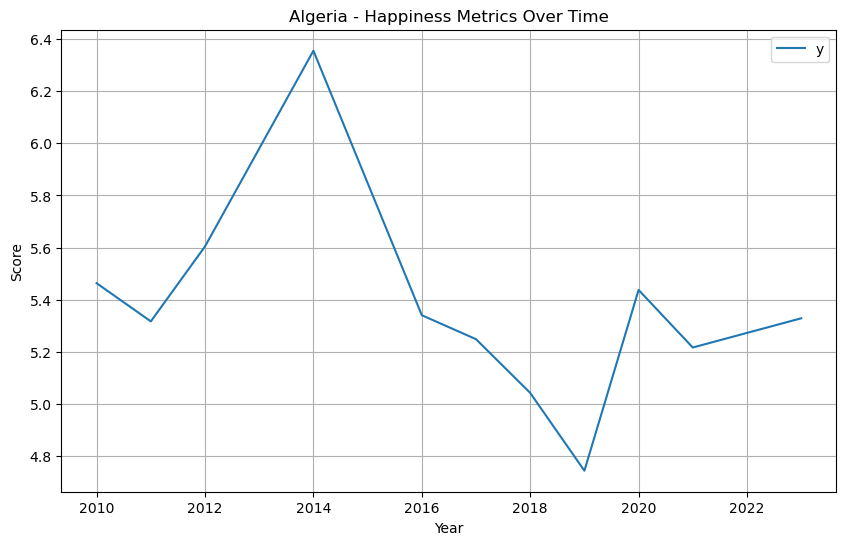

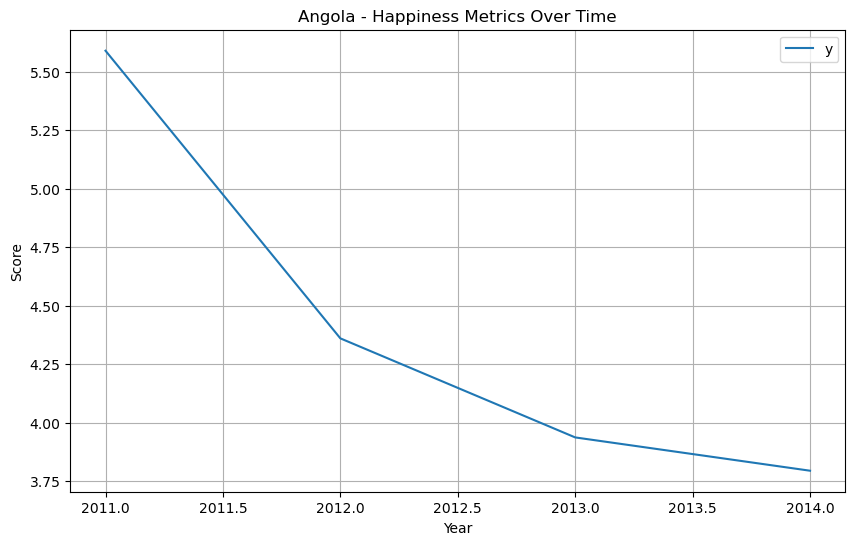

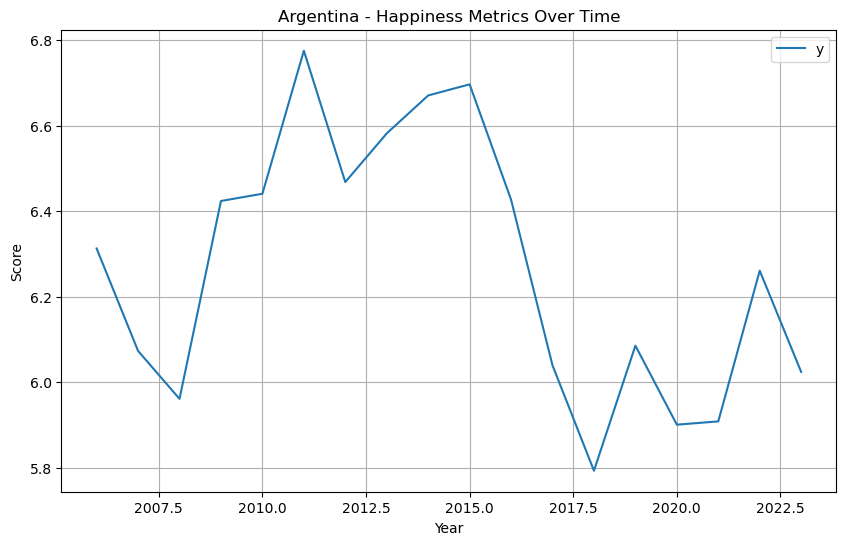

...

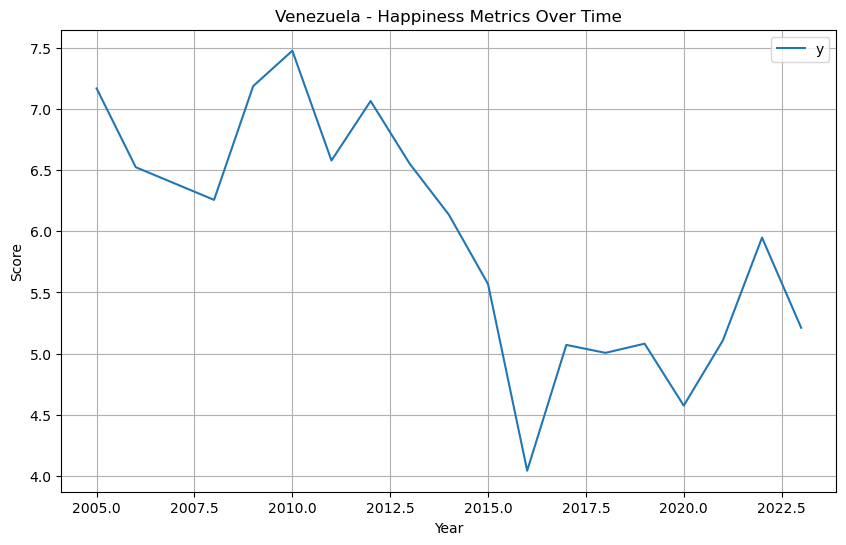

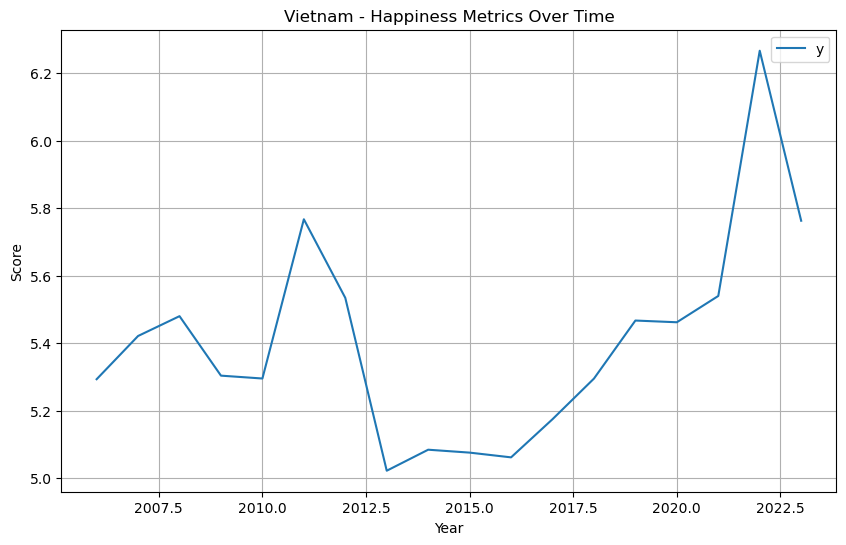

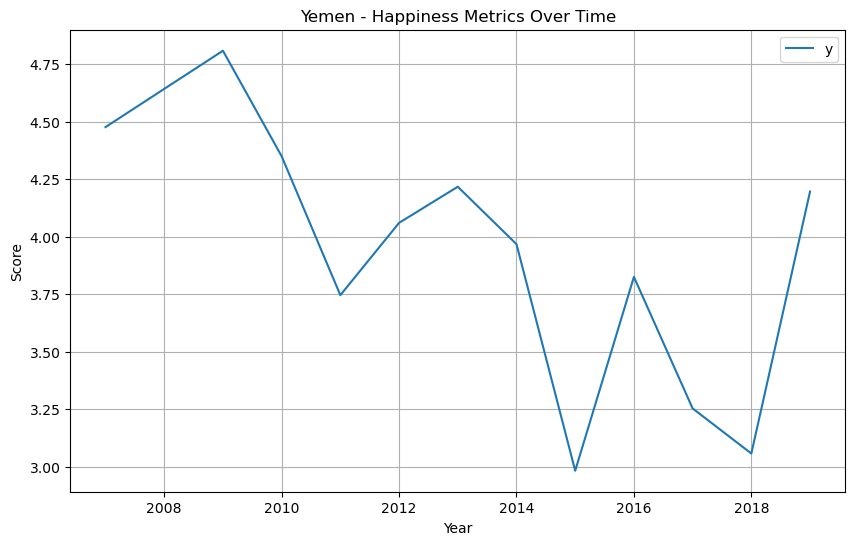

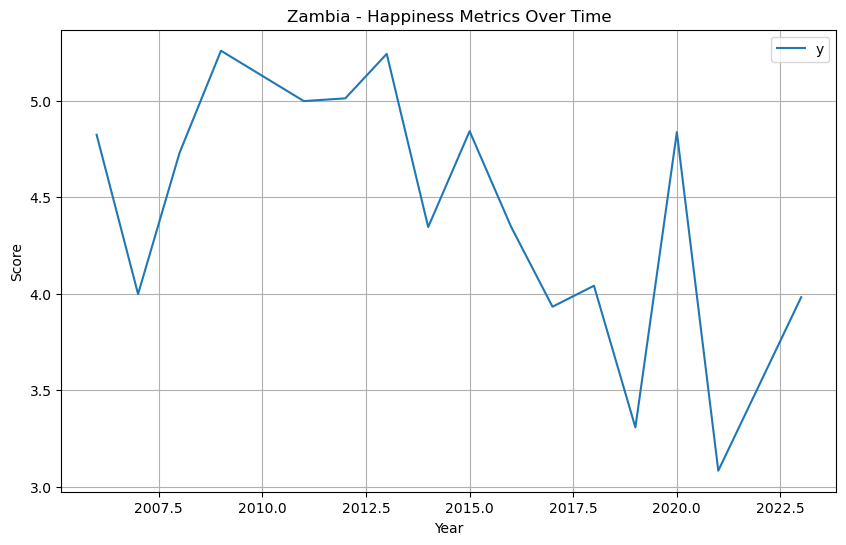

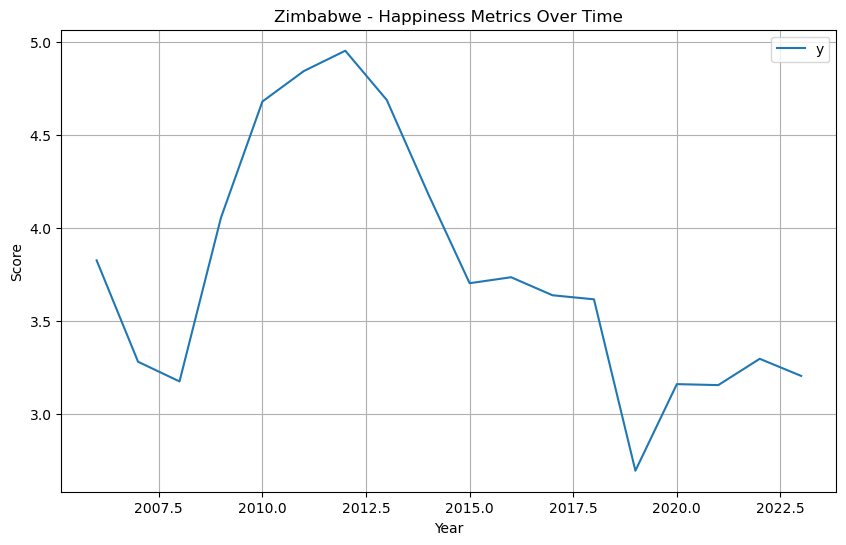

In [74]:
# Happiness Chart for each country

# Get unique country names
countries = happiness['Country Name'].unique()

# Define the columns to plot
columns_to_plot = ['y']

# Iterate over each country
for country in countries:
    # Filter data for the current country
    country_data = happiness[happiness['Country Name'] == country]
    
    # Plot the data
    plt.figure(figsize=(10, 6))
    for column in columns_to_plot:
        plt.plot(country_data['Year'], country_data[column], label=column)
    plt.title(f'{country} - Happiness Metrics Over Time')
    plt.xlabel('Year')
    plt.ylabel('Score')
    plt.legend()
    plt.grid(True)
    plt.show()

In [75]:
# Print country data columns
print(country_data.columns)

Index(['Country Name', 'Regional Indicator', 'Year', 'y', 'Log GDP Per Capita',
       'Social Support', 'Healthy Life Expectancy At Birth',
       'Freedom To Make Life Choices', 'Generosity',
       'Perceptions Of Corruption', 'Positive Affect', 'Negative Affect',
       'Confidence In National Government', 'ds'],
      dtype='object')


# Seaborn

C:\Users\Sean\anaconda3\envs\dev\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


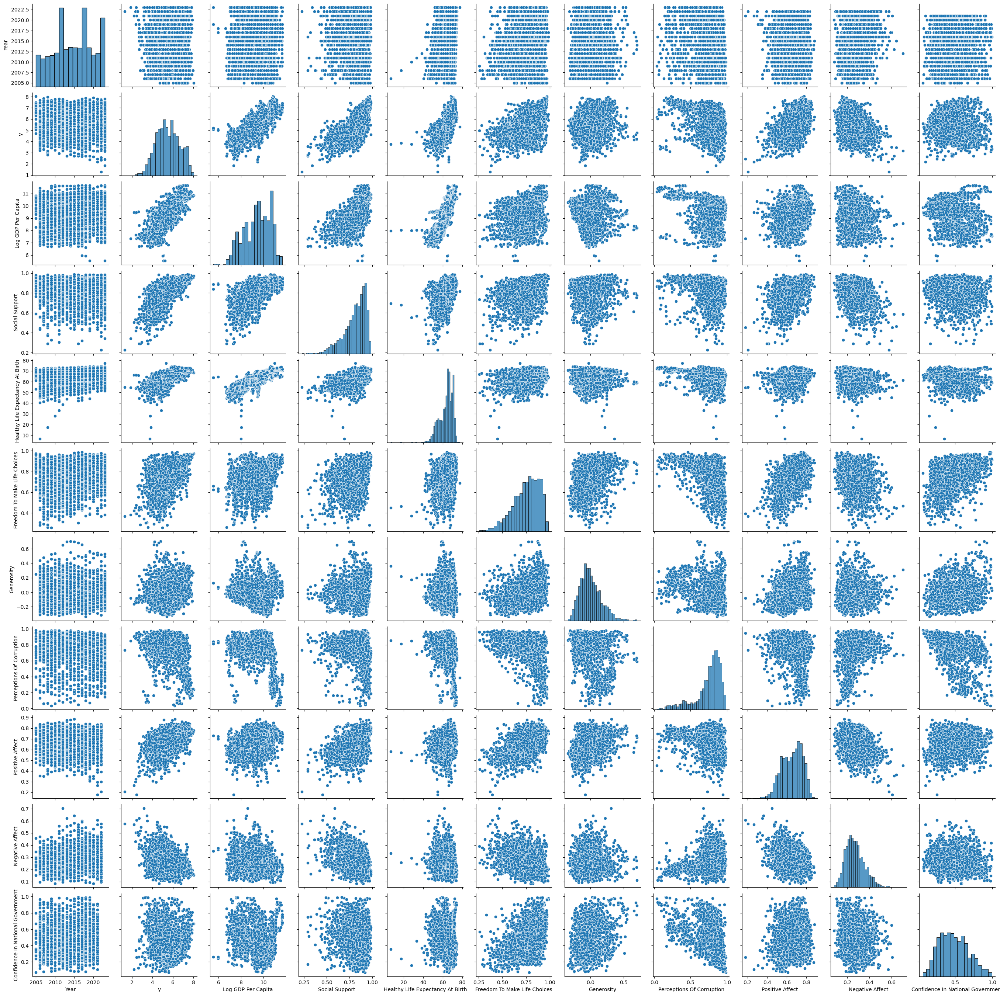

In [76]:
# Seaborn scatterplots
sns.pairplot(happiness)

In [77]:
# Impute missing values with mean
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

# Split Data
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.2, random_state=42)

# Choose a Model (Linear Regression)
model = LinearRegression()

# Train the Model
model.fit(X_train, y_train)

# Evaluate the Model
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Mean Squared Error & R^2 Score

In [78]:
# Print Mean Squared Error and R^2 Score
print("Mean Squared Error:", mse)
print("R^2 Score:", r2)

Mean Squared Error: 0.01691733693252436
R^2 Score: 0.931647123504952
